In [85]:
# import library
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib_venn import venn2, venn2_circles
import seaborn as sns
from tqdm.notebook import tqdm
import pathlib
import plotly
import plotly.express as px

In [86]:
def calc_haversine(lat1, lon1, lat2, lon2):
    """Calculates the great circle distance between two points
    on the earth. Inputs are array-like and specified in decimal degrees.
    """
    RADIUS = 6_367_000
    lat1, lon1, lat2, lon2 = map(np.radians, [lat1, lon1, lat2, lon2])
    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + \
        np.cos(lat1) * np.cos(lat2) * np.sin(dlon/2)**2
    dist = 2 * RADIUS * np.arcsin(a**0.5)
    return dist

In [87]:
def visualize_trafic(df, center, zoom=9):
    fig = px.scatter_mapbox(df,
                            # Here, plotly gets, (x,y) coordinates
                            lat="latDeg",
                            lon="lngDeg",
                            
                            #Here, plotly detects color of series
                            color="phoneName",
                            labels="phoneName",
                            
                            zoom=zoom,
                            center=center,
                            height=600,
                            width=800)
    fig.update_layout(mapbox_style='stamen-terrain')
    fig.update_layout(margin={"r": 0, "t": 0, "l": 0, "b": 0})
    fig.update_layout(title_text="GPS trafic")
    fig.show()
    
def visualize_collection(df, collection):
    target_df = df[df['collectionName']==collection].copy()
    lat_center = target_df['latDeg'].mean()
    lng_center = target_df['lngDeg'].mean()
    center = {"lat":lat_center, "lon":lng_center}
    
    visualize_trafic(target_df, center)

In [88]:
def add_distance_diff(df):
    # shift(1): 上のやつが1個下に下がる → 前のデータ
    # shift(-1): 下のやつが1個上に上がる → 次のデータ
    df['latDeg_prev'] = df['latDeg'].shift(1)
    df['latDeg_next'] = df['latDeg'].shift(-1)
    df['lngDeg_prev'] = df['lngDeg'].shift(1)
    df['lngDeg_next'] = df['lngDeg'].shift(-1)
    df['phone_prev'] = df['phone'].shift(1)
    df['phone_next'] = df['phone'].shift(-1)
    
    df['latDeg_gt_prev'] = df['latDeg_gt'].shift(1)
    df['latDeg_gt_next'] = df['latDeg_gt'].shift(-1)
    df['lngDeg_gt_prev'] = df['lngDeg_gt'].shift(1)
    df['lngDeg_gt_next'] = df['lngDeg_gt'].shift(-1)
    
    df['latDeg_prev_diff'] = df['latDeg'] - df['latDeg_prev']
    df['latDeg_next_diff'] = df['latDeg_next'] - df['latDeg']
    df['latDeg_gt_prev_diff'] = df['latDeg_gt'] - df['latDeg_gt_prev']
    df['latDeg_gt_next_diff'] = df['latDeg_gt_next'] - df['latDeg_gt']
    
    df['lngDeg_prev_diff'] = df['lngDeg'] - df['lngDeg_prev']
    df['lngDeg_next_diff'] = df['lngDeg_next'] - df['lngDeg']
    df['lngDeg_gt_prev_diff'] = df['lngDeg_gt'] - df['lngDeg_gt_prev']
    df['lngDeg_gt_next_diff'] = df['lngDeg_gt_next'] - df['lngDeg_gt']
    
    df['dist_prev'] = calc_haversine(df['latDeg'], df['lngDeg'], df['latDeg_prev'], df['lngDeg_prev'])
    df['dist_next'] = calc_haversine(df['latDeg'], df['lngDeg'], df['latDeg_next'], df['lngDeg_next'])
    
    df['dist_gt_prev'] = calc_haversine(df['latDeg_gt'], df['lngDeg_gt'], df['latDeg_gt_prev'], df['lngDeg_gt_prev'])
    df['dist_gt_next'] = calc_haversine(df['latDeg_gt'], df['lngDeg_gt'], df['latDeg_gt_next'], df['lngDeg_gt_next'])
    
    df.loc[df['phone']!=df['phone_prev'], ['latDeg_prev', 'lngDeg_prev', 'dist_prev', 
                                           'latDeg_gt_prev', 'lngDeg_gt_prev', 'dist_gt_prev',
                                          'latDeg_prev_diff', 'latDeg_gt_prev_diff',
                                          'lngDeg_prev_diff', 'lngDeg_gt_prev_diff']] = np.nan
    
    df.loc[df['phone']!=df['phone_next'], ['latDeg_next', 'lngDeg_next', 'dist_next', 
                                           'latDeg_gt_next', 'lngDeg_gt_next', 'dist_gt_next',
                                          'latDeg_next_diff', 'latDeg_gt_next_diff',
                                          'lngDeg_next_diff', 'lngDeg_gt_next_diff']] = np.nan
    
    return df

In [89]:
INPUT = '../input/google-smartphone-decimeter-challenge'

# filtered_train = pd.read_csv(INPUT + '/' + 'baseline_locations_filtered_train.csv')
filtered_train = pd.read_csv('../output/filtered_nb017.csv')
test = pd.read_csv(INPUT + '/' + 'baseline_locations_test.csv')
sample_sub = pd.read_csv(INPUT + '/' + 'sample_submission.csv')

# ground truth
p = pathlib.Path(INPUT)
gt_files = list(p.glob('train/*/*/ground_truth.csv'))

gts = []
for gt_file in gt_files:
    gts.append(pd.read_csv(gt_file))
ground_truth = pd.concat(gts)

## EDA

In [90]:
tmp1 = ground_truth.copy()
tmp1['phone'] = tmp1['collectionName'] + '_' + tmp1['phoneName']
tmp1['phoneName'] = tmp1['phoneName'] + '_GT'
tmp = filtered_train.append(tmp1)

In [91]:
# sub形式にしたfiltered_train済みbaselineを、gtとmergeできる形にする
filtered_train['collectionName'] = filtered_train['phone'].apply(lambda x: x.split('_')[0])
filtered_train['phoneName'] = filtered_train['phone'].apply(lambda x: x.split('_')[1])
filtered_train.head()

,phone,millisSinceGpsEpoch,latDeg,lngDeg,collectionName,phoneName
0,2020-05-14-US-MTV-1_Pixel4,1273529463442,37.423549,-122.094006,2020-05-14-US-MTV-1,Pixel4
1,2020-05-14-US-MTV-1_Pixel4,1273529464442,37.423563,-122.094056,2020-05-14-US-MTV-1,Pixel4
2,2020-05-14-US-MTV-1_Pixel4,1273529465442,37.423571,-122.094090,2020-05-14-US-MTV-1,Pixel4
3,2020-05-14-US-MTV-1_Pixel4,1273529466442,37.423576,-122.094109,2020-05-14-US-MTV-1,Pixel4
4,2020-05-14-US-MTV-1_Pixel4,1273529467442,37.423577,-122.094116,2020-05-14-US-MTV-1,Pixel4


In [92]:
filtered_train.describe()

,millisSinceGpsEpoch,latDeg,lngDeg
count,1.313420e+05,131342.000000,131342.000000
mean,1.287913e+12,37.435205,-122.154923
std,1.162110e+10,0.082712,0.145972
min,1.273529e+12,37.322858,-122.428932
25%,1.275424e+12,37.371572,-122.275109
50%,1.283279e+12,37.424360,-122.118313
75%,1.302558e+12,37.469106,-122.069086
max,1.303771e+12,37.690801,-121.881879


## visualize traffic

In [93]:
tmp1 = ground_truth.copy()
tmp1['phone'] = tmp1['collectionName'] + '_' + tmp1['phoneName']
tmp1['phoneName'] = tmp1['phoneName'] + '_GT'
tmp = filtered_train.append(tmp1)

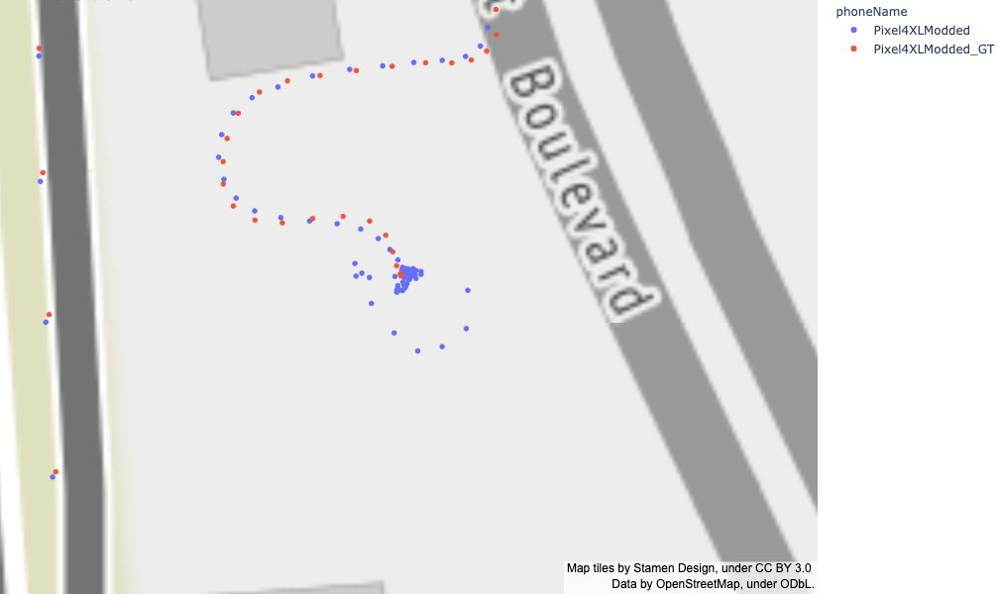

In [94]:
visualize_trafic(tmp[tmp['phone']=='2020-05-14-US-MTV-1_Pixel4XLModded'],center={"lat":37.6458, "lon":-122.4056}, zoom=19)

## graph

In [ ]:
ground_truth = ground_truth.rename(columns={'latDeg':'latDeg_gt', 'lngDeg':'lngDeg_gt',
                                           'heightAboveWgs84EllipsoidM':'heightAboveWgs84EllipsoidM_gt'})
filtered_train = filtered_train.merge(ground_truth, on=['collectionName', 'phoneName', 'millisSinceGpsEpoch'], how='inner')
filtered_train['dist_err'] = calc_haversine(filtered_train['latDeg_gt'], filtered_train['lngDeg_gt'], filtered_train['latDeg'], filtered_train['lngDeg'])
filtered_train = add_distance_diff(filtered_train)
filtered_train.head()

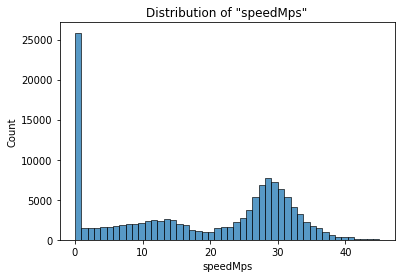

In [38]:
sns.histplot(filtered_train['speedMps'])
plt.title('Distribution of "speedMps"');

In [39]:
filtered_train.loc[filtered_train['speedMps']==0.0, 'speed0'] = 'speed = 0'
filtered_train.loc[filtered_train['speedMps']>0.0, 'speed0'] = 'speed > 0'

<AxesSubplot:xlabel='speed0', ylabel='dist_err'>

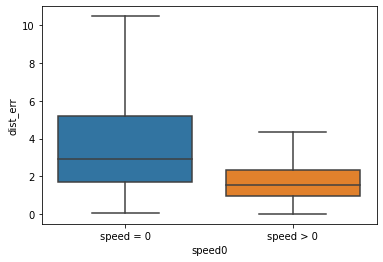

In [40]:
sns.boxplot(x='speed0', y='dist_err', data=filtered_train, showfliers=False)

### visualize_err_move_dist
- baselineとgtとの誤差
- baselineの移動距離、gtの移動距離とスピードのグラフ

In [41]:
def visualize_err_move_dist(df, phone, reject_outlier=True):
    fig, axes = plt.subplots(figsize=(20, 10), nrows=2, sharex=True)
    df = df[df['phone']==phone]
    if reject_outlier:
        th = (df['dist_err'].std()*3) + df['dist_err'].mean() # 99.7%信頼区間
        df = df[df['dist_err']<th] # gtとの距離
        
    axes[0].plot(df['millisSinceGpsEpoch'], df['dist_err'], label='err(filtered train)')
    axes[1].plot(df['millisSinceGpsEpoch'], df['speedMps'], label='speedMps')
    axes[1].plot(df['millisSinceGpsEpoch'], df['dist_prev'], label='move dist(filterd train)')
    axes[1].plot(df['millisSinceGpsEpoch'], df['dist_gt_prev'], label='move dist(ground_truth)')
    axes[0].legend(loc='upper right')
    axes[1].legend(loc='upper right')
    axes[0].grid(color='g', linestyle=':', linewidth=0.3)
    axes[1].grid(color='g', linestyle=':', linewidth=0.3)
    fig.suptitle(phone, fontsize=16)

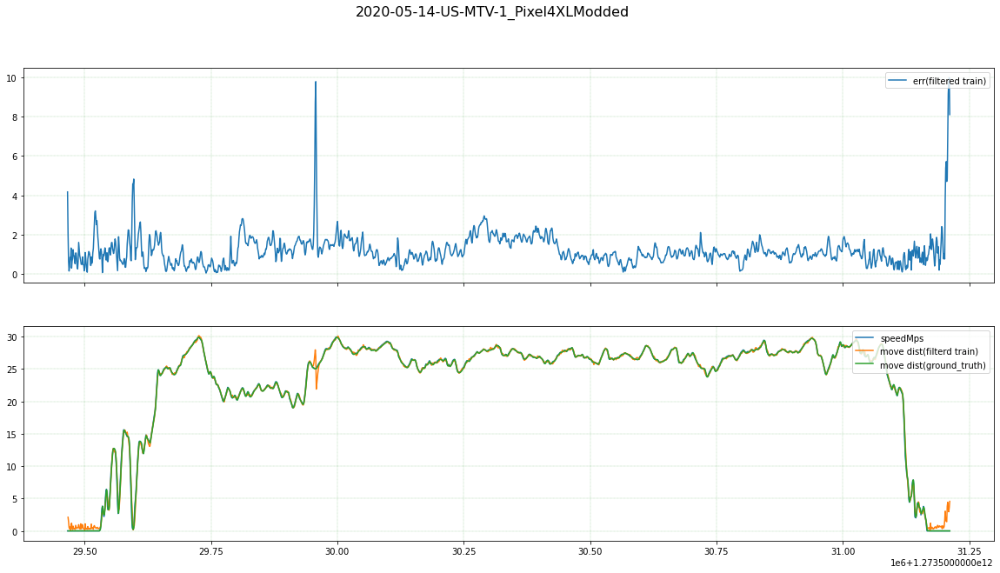

In [42]:
visualize_err_move_dist(filtered_train, '2020-05-14-US-MTV-1_Pixel4XLModded', reject_outlier=False)

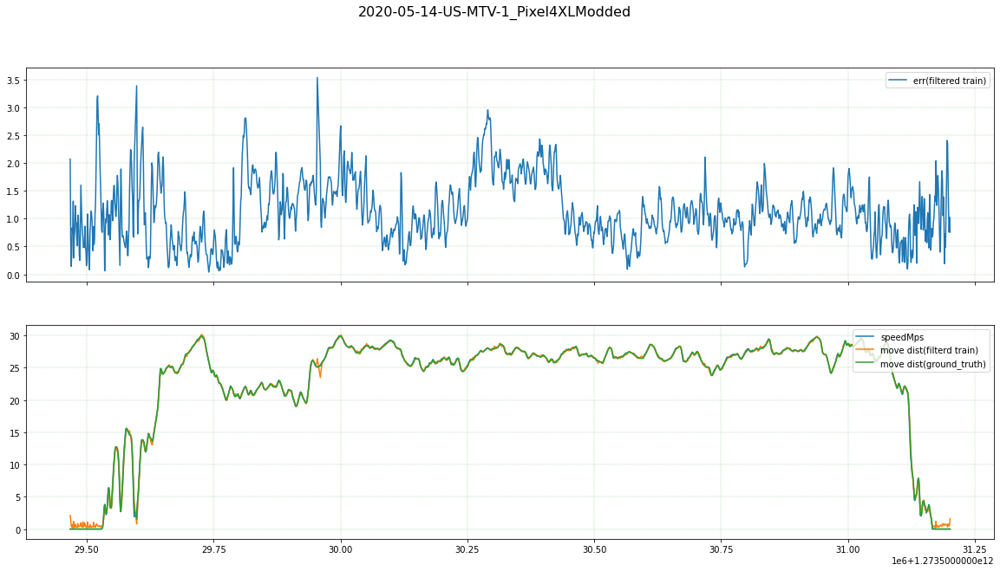

In [44]:
visualize_err_move_dist(filtered_train, '2020-05-14-US-MTV-1_Pixel4XLModded', reject_outlier=True)

/Users/shugo/Desktop/Competitions/kaggle/outdoor/lib/python3.7/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


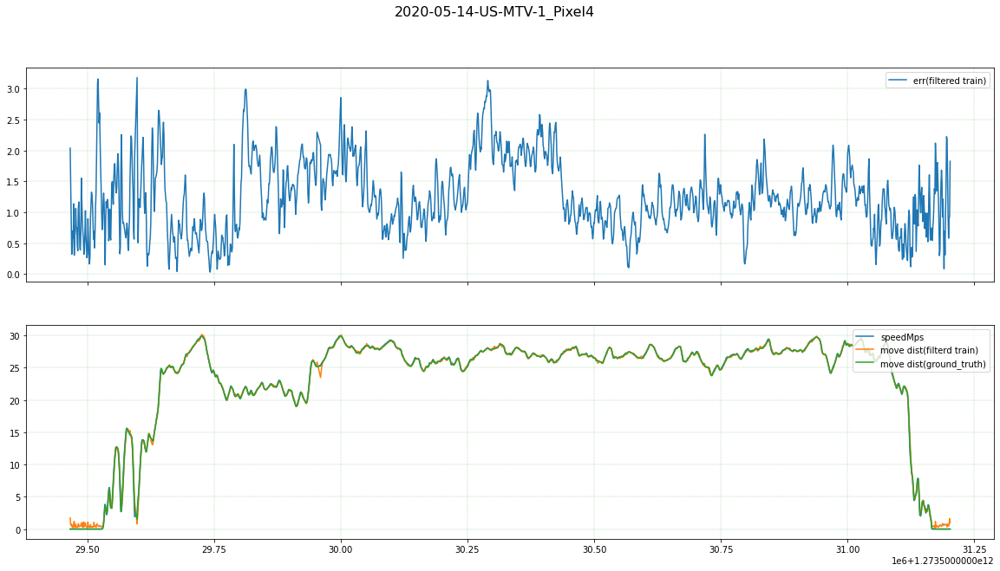

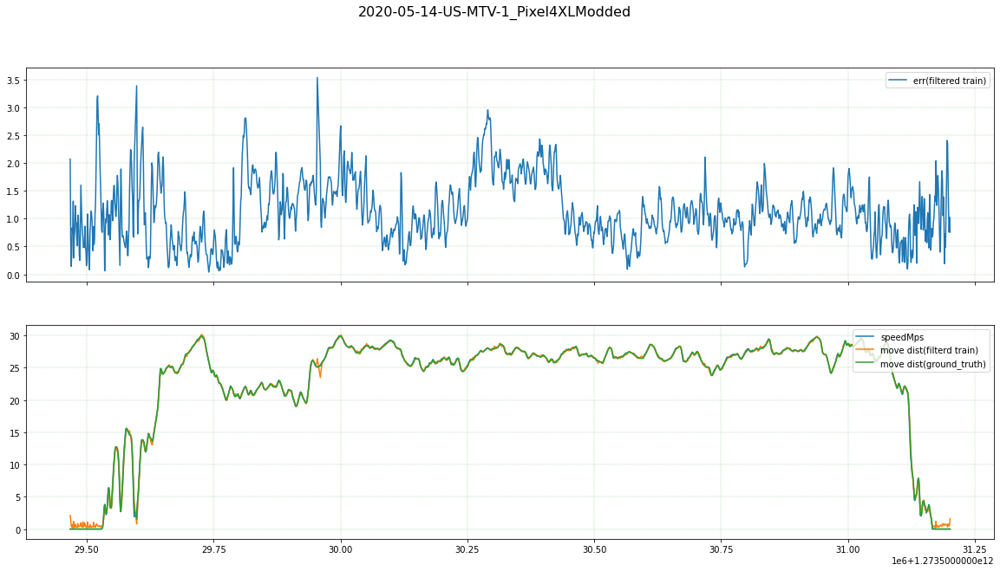

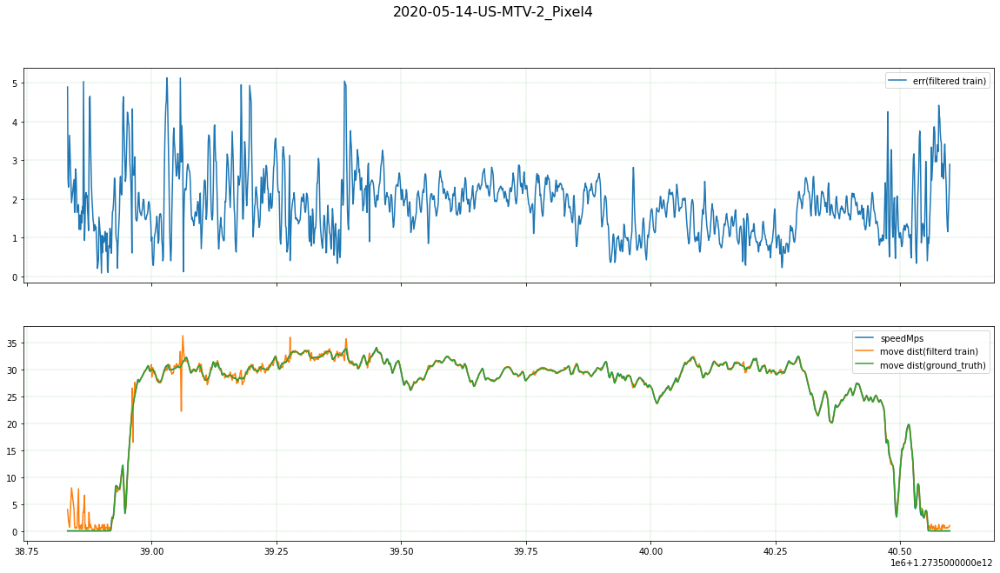

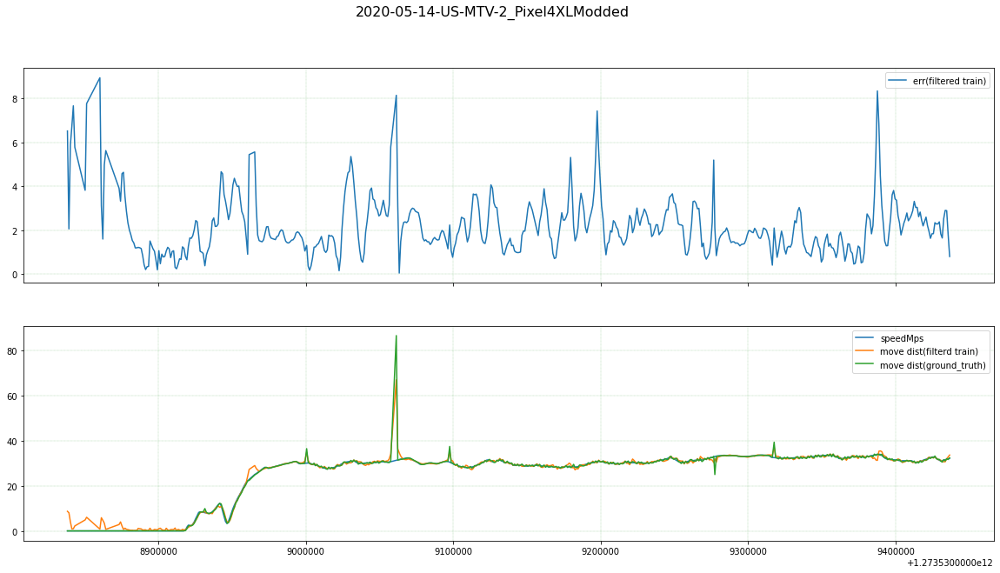

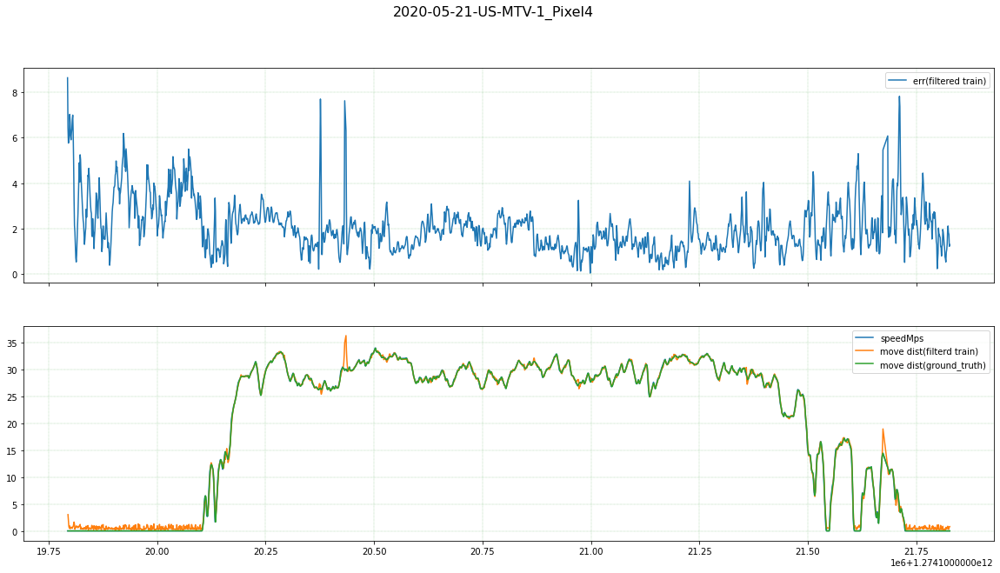

...

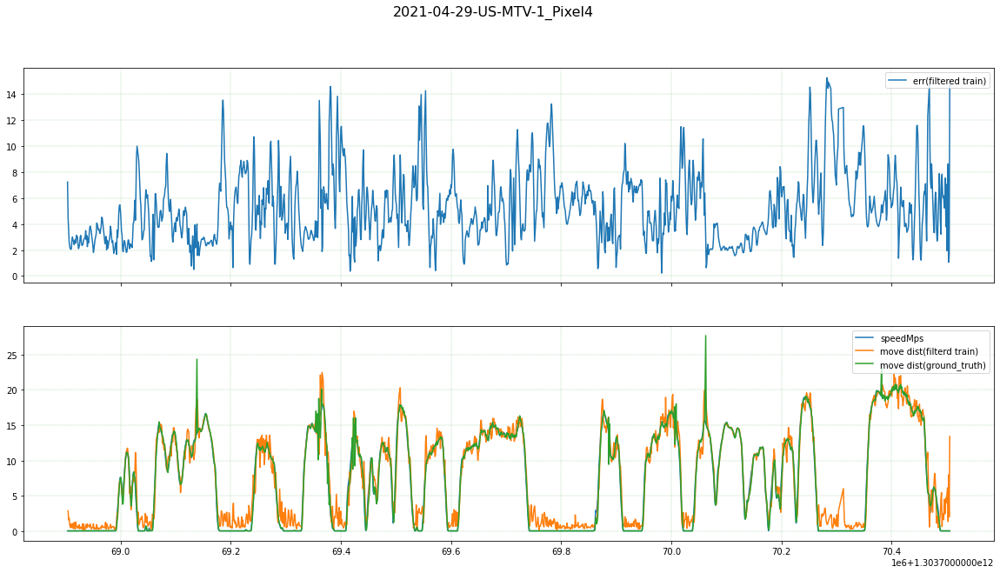

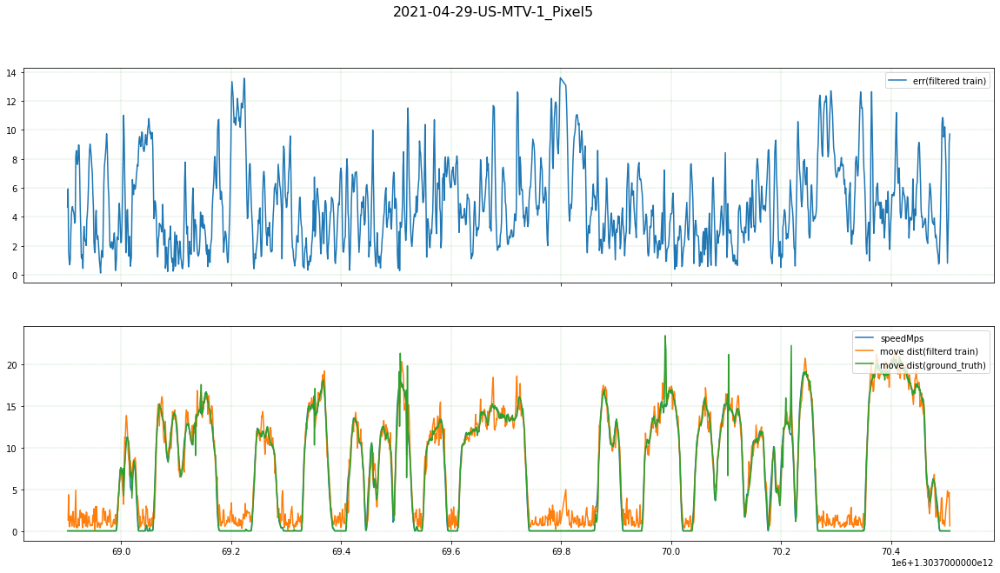

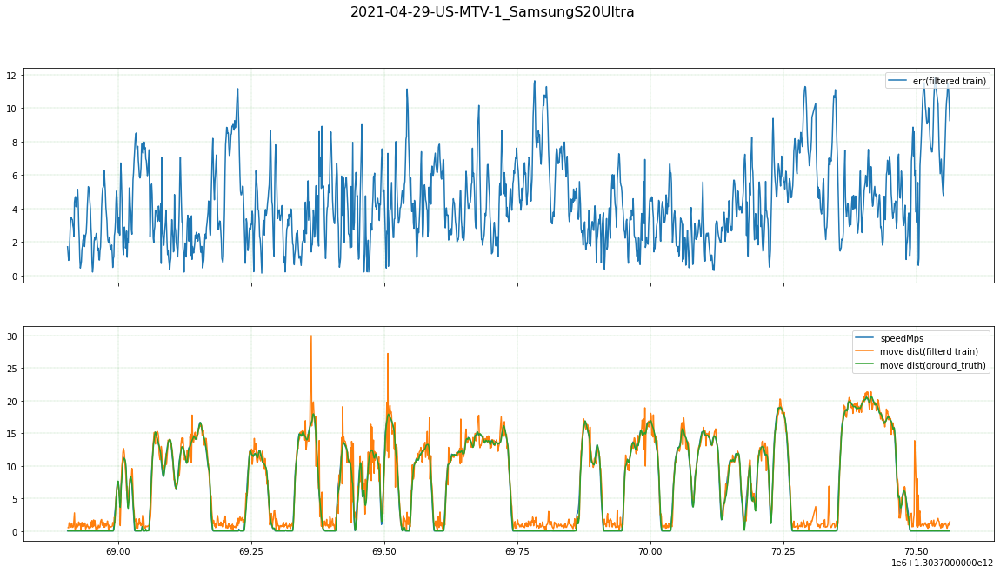

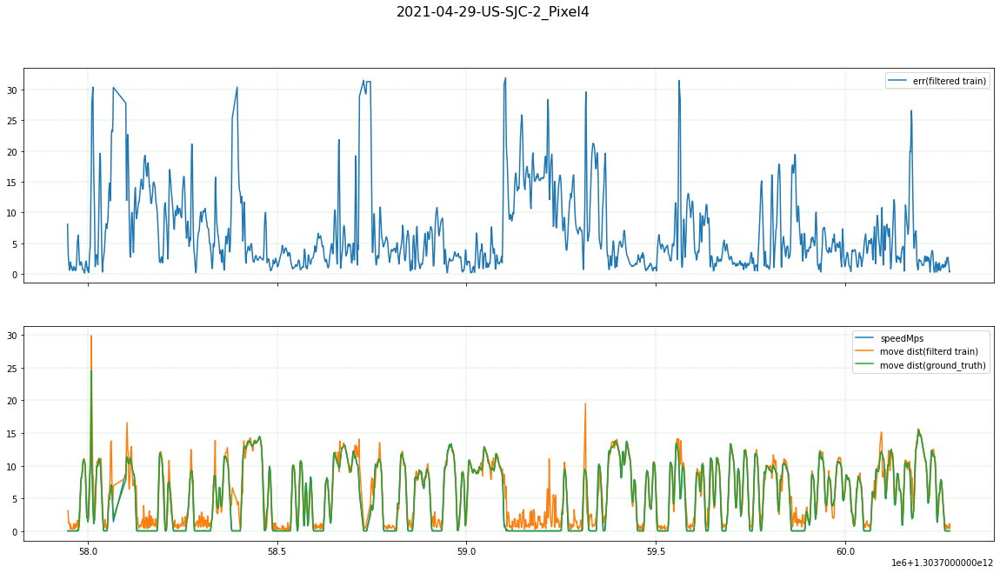

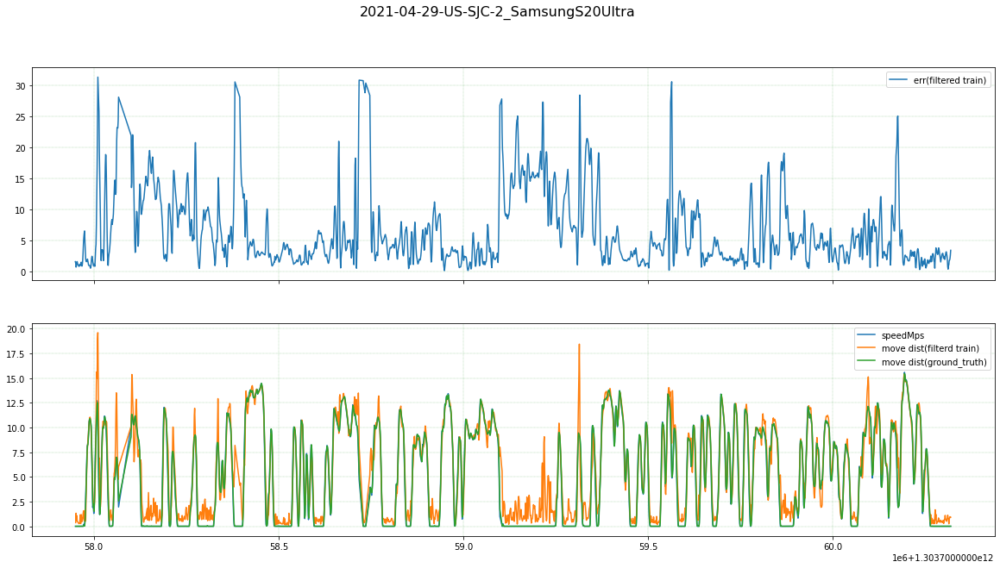

In [43]:
phones = filtered_train['phone'].unique()
for phone in phones:
    visualize_err_move_dist(filtered_train, phone)